In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image as Img
from pylab import imread,subplot,imshow,show

In [2]:
###################Problem1#######################

In [3]:
# a)
A = [[3,9,5,1], [4,25,4,3], [63,13,23,9], [6,32,77,0], [12,8,6,1]]
B = [[0,1,0,1], [0,1,1,0], [0,0,0,1], [1,1,0,1], [0,1,0,0]]
C = np.multiply(A,B)
print(C)

[[ 0  9  0  1]
 [ 0 25  4  0]
 [ 0  0  0  9]
 [ 6 32  0  0]
 [ 0  8  0  0]]


In [4]:
# b)
inner_product = np.inner(C[1], C[2])
print(inner_product)

0


In [5]:
###################Problem2#######################

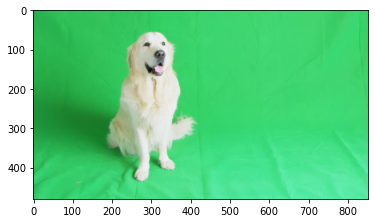

In [6]:
A = Img.open('dog.jpg')
plt.imshow(A)

245


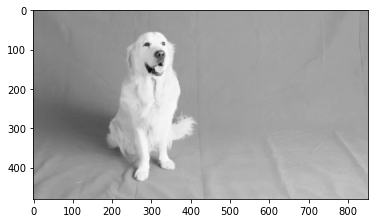

In [7]:
B = A.convert('L')
plt.imshow(B, cmap = plt.get_cmap('gray'))
Barray = np.asarray(B)
print(max(map(max, Barray)))

252.65999999999997
255.0


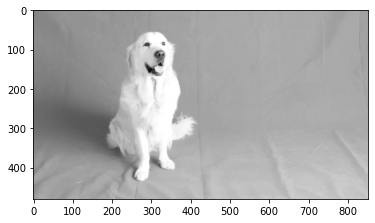

In [8]:
temp = imread('dog.jpg')
grayA = np.dot(temp[...,:3], [0.299, 0.587, 0.144])
print(max(map(max, grayA)))
C = np.where((255 - grayA) < 15,255,grayA+15)
print(max(map(max, C)))
plt.imshow(C, cmap = plt.get_cmap('gray'))

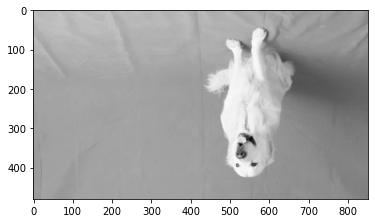

In [9]:
D = B.transpose(method=Img.FLIP_TOP_BOTTOM)
D = D.transpose(method=Img.FLIP_LEFT_RIGHT)
plt.imshow(D, cmap = plt.get_cmap('gray'))

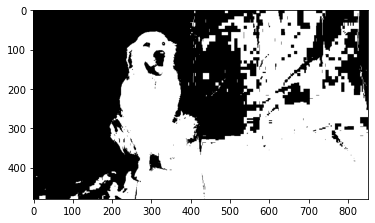

In [10]:
med = np.median(grayA)
E = np.where(grayA < med,0,1)           
plt.imshow(E, cmap = plt.get_cmap('gray'))

In [11]:
###################Problem3#######################

In [12]:
def compute_norm_rgb_histogram(rgb):
    rgb = np.asarray(rgb)
    intensity = []
    for i in range(3):
        scale = rgb[:,:,i]
        scaleInten = [0 for _ in range(32)]
        for m in range(len(scale)):
            for n in range(len(scale[0])):
                scaleInten[int(scale[m][n]/8)]+=1
        intensity+=scaleInten
        
    ret = [[],[],[]]
    for i in range(96):
        ret[int(i/32)] += [i]*intensity[i]
    
    colors = ['red','green','blue']
  
    return plt.hist(ret,96, color = colors, label = colors)

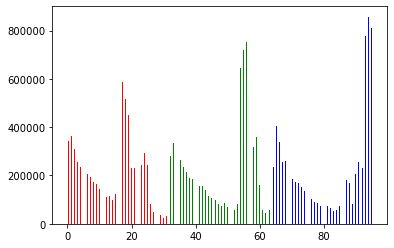

In [13]:
image = imread('geisel.jpg')
plt.show(compute_norm_rgb_histogram(image))

In [14]:
###################Problem4#######################

In [15]:
# a)
def get_foreground(rgb):
    rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
    lower_green = np.array([0, 118, 0])
    upper_green = np.array([100, 255, 220])
    
    mask = cv2.inRange(rgb, lower_green, upper_green)
    return mask
    plt.imshow(mask, cmap='gray')

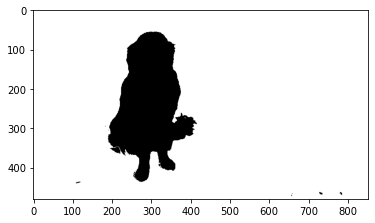

In [16]:
dog = cv2.imread('dog.jpg')
plt.imshow(get_foreground(dog), cmap='gray')

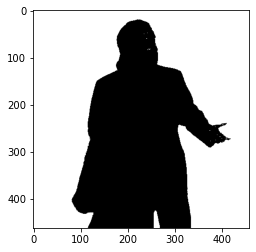

In [17]:
travolta = imread('travolta.jpg')
plt.imshow(get_foreground(travolta), cmap='gray')

In [18]:
# b)
def get_foreground_colored(rgb):
    mask = np.logical_not(get_foreground(rgb))
    red = np.multiply(rgb[:,:,0], mask)
    green = np.multiply(rgb[:,:,1], mask)
    blue = np.multiply(rgb[:,:,2], mask)
    return np.dstack((red, green, blue))

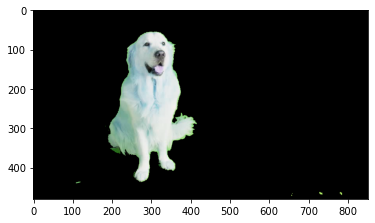

In [19]:
plt.imshow(get_foreground_colored(dog))

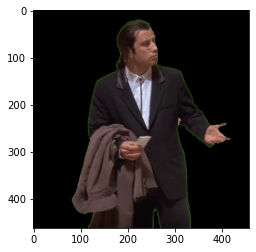

In [20]:
plt.imshow(get_foreground_colored(travolta))

In [21]:
# c)
def overlay(rgb):
    foregrd = get_foreground_colored(rgb)
    array = np.ones((foregrd.shape[0],foregrd.shape[1]), np.uint8)
    array[:] = 100

    backgrd = np.multiply(array, get_foreground(rgb))
    ret = foregrd[:,:,2]+backgrd
    data = Img.fromarray(backgrd)
    return np.dstack((foregrd[:,:,0],foregrd[:,:,1],ret))

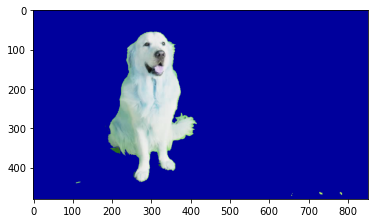

In [22]:
plt.imshow(overlay(dog))

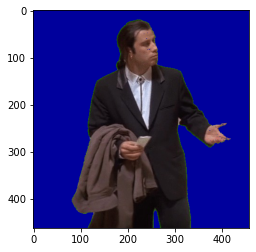

In [23]:
plt.imshow(overlay(travolta))

In [24]:
###################Problem5#######################

Text(0.5, 1.0, 'Bicubic ratio = 0.7')

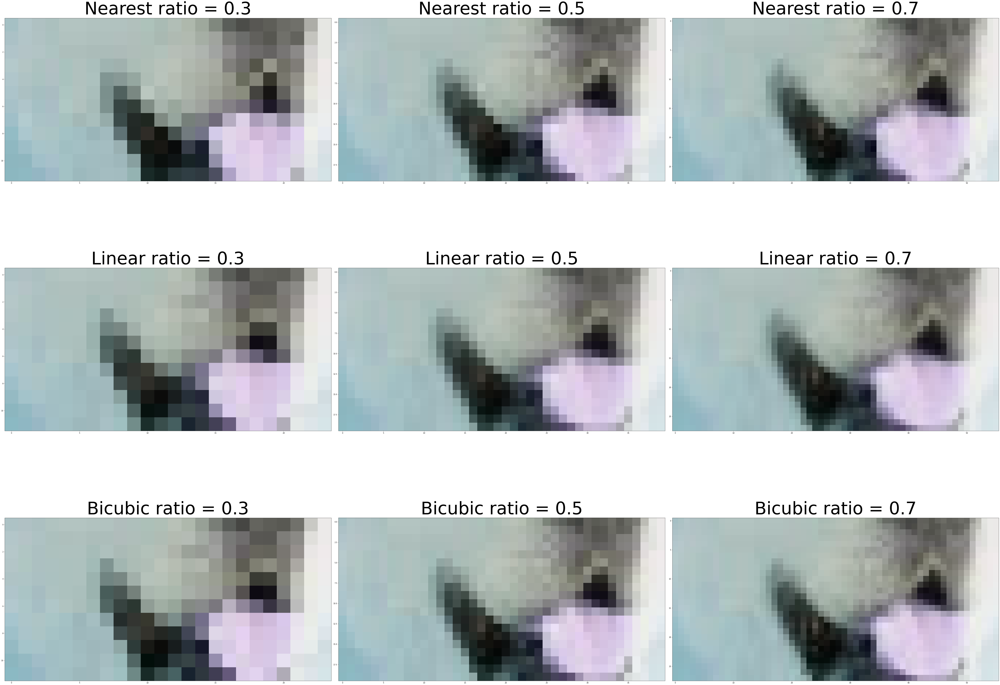

In [25]:
# a)
dog = cv2.imread('dog.jpg')
travolta = cv2.imread('travolta.jpg')
geisel = cv2.imread('geisel.jpg')
Nearestdog3 = cv2.resize(dog, (int(dog.shape[1]*0.3), int(dog.shape[0]*0.3)), interpolation = cv2.INTER_NEAREST)
Nearestdog5 = cv2.resize(dog, (int(dog.shape[1]*0.5), int(dog.shape[0]*0.5)), interpolation = cv2.INTER_NEAREST)
Nearestdog7 = cv2.resize(dog, (int(dog.shape[1]*0.7), int(dog.shape[0]*0.7)), interpolation = cv2.INTER_NEAREST)
Nearesttravolta3 = cv2.resize(travolta, (int(travolta.shape[1]*0.3), int(travolta.shape[0]*0.3)), interpolation = cv2.INTER_NEAREST)
Nearesttravolta5 = cv2.resize(travolta, (int(travolta.shape[1]*0.5), int(travolta.shape[0]*0.5)), interpolation = cv2.INTER_NEAREST)
Nearesttravolta7 = cv2.resize(travolta, (int(travolta.shape[1]*0.7), int(travolta.shape[0]*0.7)), interpolation = cv2.INTER_NEAREST)
Nearestgeisel3 = cv2.resize(geisel, (int(geisel.shape[1]*0.3), int(geisel.shape[0]*0.3)), interpolation = cv2.INTER_NEAREST)
Nearestgeisel5 = cv2.resize(geisel, (int(geisel.shape[1]*0.5), int(geisel.shape[0]*0.5)), interpolation = cv2.INTER_NEAREST)
Nearestgeisel7 = cv2.resize(geisel, (int(geisel.shape[1]*0.7), int(geisel.shape[0]*0.7)), interpolation = cv2.INTER_NEAREST)
Lineardog3 = cv2.resize(dog, (int(dog.shape[1]*0.3), int(dog.shape[0]*0.3)), interpolation = cv2.INTER_LINEAR)
Lineardog5 = cv2.resize(dog, (int(dog.shape[1]*0.5), int(dog.shape[0]*0.5)), interpolation = cv2.INTER_LINEAR)
Lineardog7 = cv2.resize(dog, (int(dog.shape[1]*0.7), int(dog.shape[0]*0.7)), interpolation = cv2.INTER_LINEAR)
Lineartravolta3 = cv2.resize(travolta, (int(travolta.shape[1]*0.3), int(travolta.shape[0]*0.3)), interpolation = cv2.INTER_LINEAR)
Lineartravolta5 = cv2.resize(travolta, (int(travolta.shape[1]*0.5), int(travolta.shape[0]*0.5)), interpolation = cv2.INTER_LINEAR)
Lineartravolta7 = cv2.resize(travolta, (int(travolta.shape[1]*0.7), int(travolta.shape[0]*0.7)), interpolation = cv2.INTER_LINEAR)
Lineargeisel3 = cv2.resize(geisel, (int(geisel.shape[1]*0.3), int(geisel.shape[0]*0.3)), interpolation = cv2.INTER_LINEAR)
Lineargeisel5 = cv2.resize(geisel, (int(geisel.shape[1]*0.5), int(geisel.shape[0]*0.5)), interpolation = cv2.INTER_LINEAR)
Lineargeisel7 = cv2.resize(geisel, (int(geisel.shape[1]*0.7), int(geisel.shape[0]*0.7)), interpolation = cv2.INTER_LINEAR)
Bicubicdog3 = cv2.resize(dog, (int(dog.shape[1]*0.3), int(dog.shape[0]*0.3)), interpolation = cv2.INTER_CUBIC)
Bicubicdog5 = cv2.resize(dog, (int(dog.shape[1]*0.5), int(dog.shape[0]*0.5)), interpolation = cv2.INTER_CUBIC)
Bicubicdog7 = cv2.resize(dog, (int(dog.shape[1]*0.7), int(dog.shape[0]*0.7)), interpolation = cv2.INTER_CUBIC)
Bicubictravolta3 = cv2.resize(travolta, (int(travolta.shape[1]*0.3), int(travolta.shape[0]*0.3)), interpolation = cv2.INTER_CUBIC)
Bicubictravolta5 = cv2.resize(travolta, (int(travolta.shape[1]*0.5), int(travolta.shape[0]*0.5)), interpolation = cv2.INTER_CUBIC)
Bicubictravolta7 = cv2.resize(travolta, (int(travolta.shape[1]*0.7), int(travolta.shape[0]*0.7)), interpolation = cv2.INTER_CUBIC)
Bicubicgeisel3 = cv2.resize(geisel, (int(geisel.shape[1]*0.3), int(geisel.shape[0]*0.3)), interpolation = cv2.INTER_CUBIC)
Bicubicgeisel5 = cv2.resize(geisel, (int(geisel.shape[1]*0.5), int(geisel.shape[0]*0.5)), interpolation = cv2.INTER_CUBIC)
Bicubicgeisel7 = cv2.resize(geisel, (int(geisel.shape[1]*0.7), int(geisel.shape[0]*0.7)), interpolation = cv2.INTER_CUBIC)

cropNd3 = Nearestdog3[36:48, 78:102]
cropNd5 = Nearestdog5[60:80, 130:170]
cropNd7 = Nearestdog7[84:112, 182:238]
cropLd3 = Lineardog3[36:48, 78:102]
cropLd5 = Lineardog5[60:80, 130:170]
cropLd7 = Lineardog7[84:112, 182:238]
cropBd3 = Bicubicdog3[36:48, 78:102]
cropBd5 = Bicubicdog5[60:80, 130:170]
cropBd7 = Bicubicdog7[84:112, 182:238]
fig, axs = plt.subplots(3, 3, figsize=(80, 60))
fig.tight_layout()
axs[0, 0].imshow(cropNd3)
axs[0, 0].set_title('Nearest ratio = 0.3', fontsize=100)
axs[0, 1].imshow(cropNd5)
axs[0, 1].set_title('Nearest ratio = 0.5', fontsize=100)
axs[0, 2].imshow(cropNd7)
axs[0, 2].set_title('Nearest ratio = 0.7', fontsize=100)

axs[1, 0].imshow(cropLd3)
axs[1, 0].set_title('Linear ratio = 0.3', fontsize=100)
axs[1, 1].imshow(cropLd5)
axs[1, 1].set_title('Linear ratio = 0.5', fontsize=100)
axs[1, 2].imshow(cropLd7)
axs[1, 2].set_title('Linear ratio = 0.7', fontsize=100)

axs[2, 0].imshow(cropBd3)
axs[2, 0].set_title('Bicubic ratio = 0.3', fontsize=100)
axs[2, 1].imshow(cropBd5)
axs[2, 1].set_title('Bicubic ratio = 0.5', fontsize=100)
axs[2, 2].imshow(cropBd7)
axs[2, 2].set_title('Bicubic ratio = 0.7', fontsize=100)

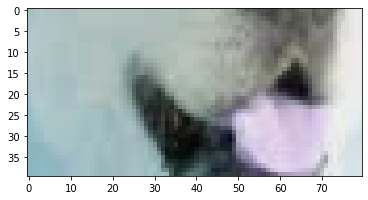

In [26]:
plt.imshow(dog[120:160, 260:340])

Text(0.5, 1.0, 'Bicubic ratio = 0.7')

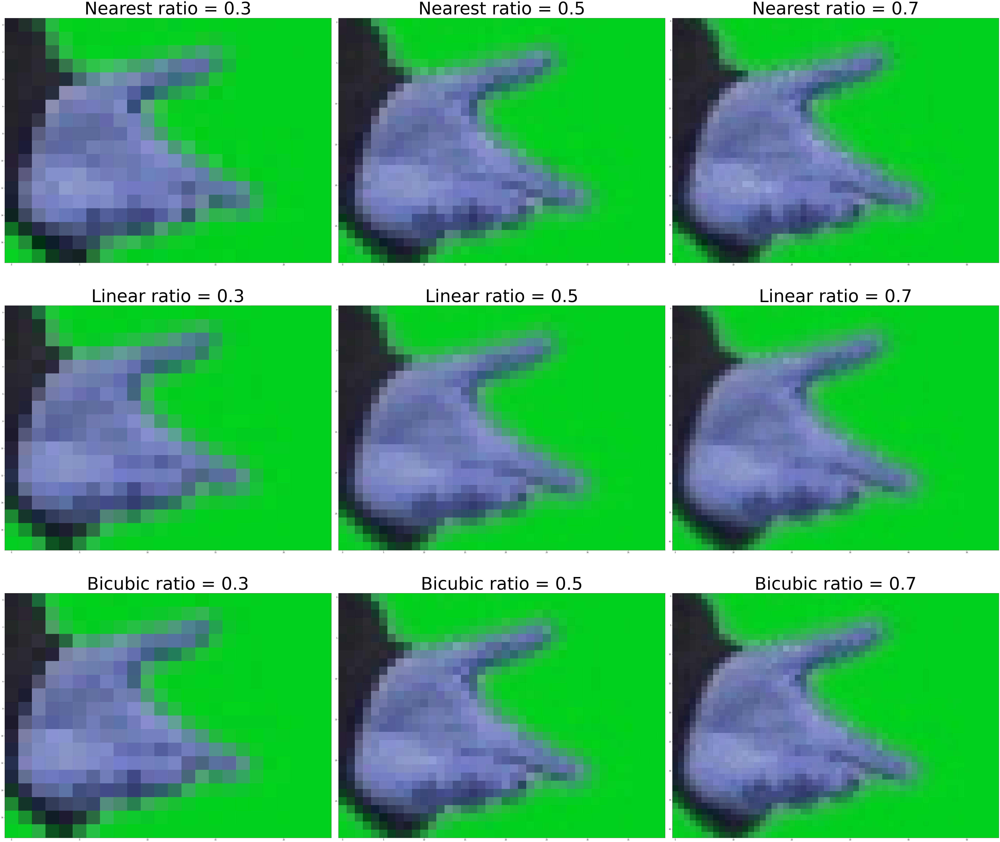

In [27]:
cropNt3 = Nearesttravolta3[69:87, 108:132]
cropNt5 = Nearesttravolta5[115:145, 180:220]
cropNt7 = Nearesttravolta7[161:203, 252:308]
cropLt3 = Lineartravolta3[69:87, 108:132]
cropLt5 = Lineartravolta5[115:145, 180:220]
cropLt7 = Lineartravolta7[161:203, 252:308]
cropBt3 = Bicubictravolta3[69:87, 108:132]
cropBt5 = Bicubictravolta5[115:145, 180:220]
cropBt7 = Bicubictravolta7[161:203, 252:308]
fig, axs = plt.subplots(3, 3, figsize=(80, 69))
fig.tight_layout()
axs[0, 0].imshow(cropNt3)
axs[0, 0].set_title('Nearest ratio = 0.3', fontsize=100)
axs[0, 1].imshow(cropNt5)
axs[0, 1].set_title('Nearest ratio = 0.5', fontsize=100)
axs[0, 2].imshow(cropNt7)
axs[0, 2].set_title('Nearest ratio = 0.7', fontsize=100)
axs[1, 0].imshow(cropLt3)
axs[1, 0].set_title('Linear ratio = 0.3', fontsize=100)
axs[1, 1].imshow(cropLt5)
axs[1, 1].set_title('Linear ratio = 0.5', fontsize=100)
axs[1, 2].imshow(cropLt7)
axs[1, 2].set_title('Linear ratio = 0.7', fontsize=100)
axs[2, 0].imshow(cropBt3)
axs[2, 0].set_title('Bicubic ratio = 0.3', fontsize=100)
axs[2, 1].imshow(cropBt5)
axs[2, 1].set_title('Bicubic ratio = 0.5', fontsize=100)
axs[2, 2].imshow(cropBt7)
axs[2, 2].set_title('Bicubic ratio = 0.7', fontsize=100)

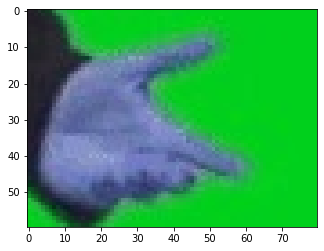

In [28]:
plt.imshow(travolta[230:290, 360:440])

Text(0.5, 1.0, 'Bicubic ratio = 0.7')

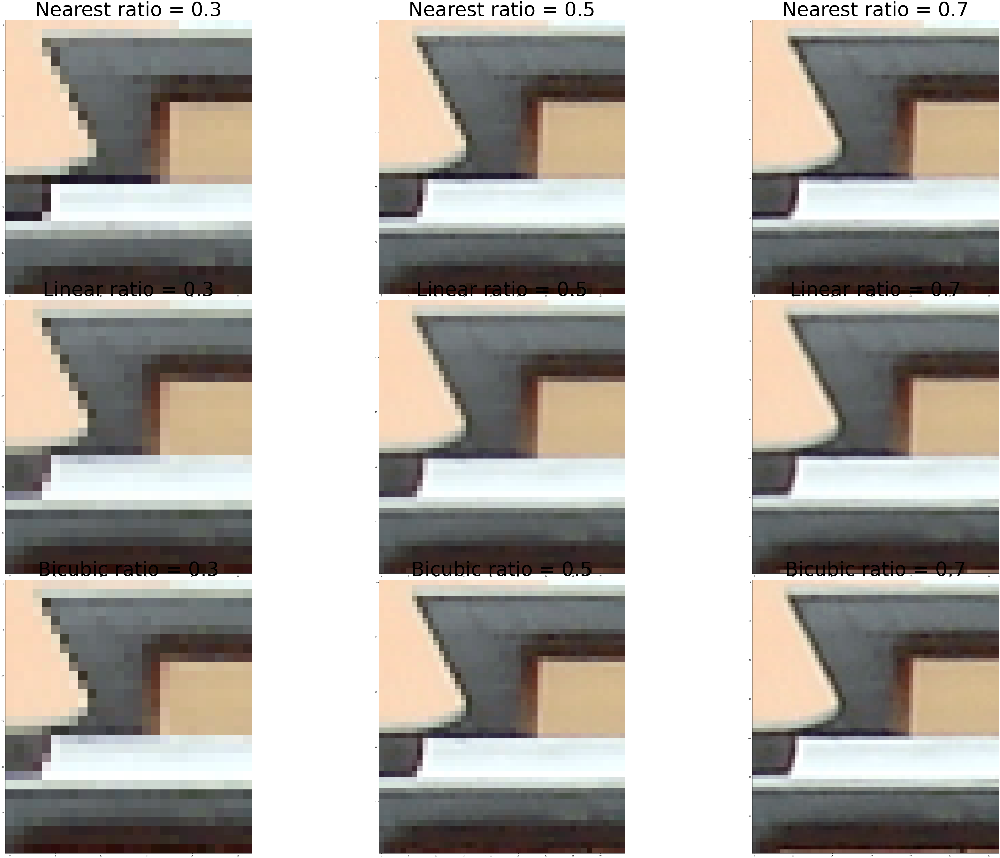

In [29]:
cropNg3 = Nearestgeisel3[204:234, 327:354]
cropNg5 = Nearestgeisel5[340:390, 545:590]
cropNg7 = Nearestgeisel7[476:546, 763:826]
cropLg3 = Lineargeisel3[204:234, 327:354]
cropLg5 = Lineargeisel5[340:390, 545:590]
cropLg7 = Lineargeisel7[476:546, 763:826]
cropBg3 = Bicubicgeisel3[204:234, 327:354]
cropBg5 = Bicubicgeisel5[340:390, 545:590]
cropBg7 = Bicubicgeisel7[476:546, 763:826]
fig, axs = plt.subplots(3, 3, figsize=(80, 60))
fig.tight_layout()
axs[0, 0].imshow(cropNg3)
axs[0, 0].set_title('Nearest ratio = 0.3', fontsize=100)
axs[0, 1].imshow(cropNg5)
axs[0, 1].set_title('Nearest ratio = 0.5', fontsize=100)
axs[0, 2].imshow(cropNg7)
axs[0, 2].set_title('Nearest ratio = 0.7', fontsize=100)
axs[1, 0].imshow(cropLg3)
axs[1, 0].set_title('Linear ratio = 0.3', fontsize=100)
axs[1, 1].imshow(cropLg5)
axs[1, 1].set_title('Linear ratio = 0.5', fontsize=100)
axs[1, 2].imshow(cropLg7)
axs[1, 2].set_title('Linear ratio = 0.7', fontsize=100)
axs[2, 0].imshow(cropBg3)
axs[2, 0].set_title('Bicubic ratio = 0.3', fontsize=100)
axs[2, 1].imshow(cropBg5)
axs[2, 1].set_title('Bicubic ratio = 0.5', fontsize=100)
axs[2, 2].imshow(cropBg7)
axs[2, 2].set_title('Bicubic ratio = 0.7', fontsize=100)

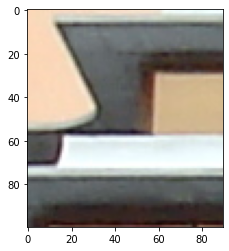

In [30]:
plt.imshow(geisel[340*2:390*2, 545*2:590*2])

In [31]:
Nearestdog5 = cv2.resize(dog, (int(dog.shape[1]*1.5), int(dog.shape[0]*1.5)), interpolation = cv2.INTER_NEAREST)
Nearestdog7 = cv2.resize(dog, (int(dog.shape[1]*1.7), int(dog.shape[0]*1.7)), interpolation = cv2.INTER_NEAREST)
Nearestdog2 = cv2.resize(dog, (int(dog.shape[1]*2), int(dog.shape[0]*2)), interpolation = cv2.INTER_NEAREST)
Nearesttravolta5 = cv2.resize(travolta, (int(travolta.shape[1]*1.5), int(travolta.shape[0]*1.5)), interpolation = cv2.INTER_NEAREST)
Nearesttravolta7 = cv2.resize(travolta, (int(travolta.shape[1]*1.7), int(travolta.shape[0]*1.7)), interpolation = cv2.INTER_NEAREST)
Nearesttravolta2 = cv2.resize(travolta, (int(travolta.shape[1]*2), int(travolta.shape[0]*2)), interpolation = cv2.INTER_NEAREST)
Nearestgeisel5 = cv2.resize(geisel, (int(geisel.shape[1]*1.5), int(geisel.shape[0]*1.5)), interpolation = cv2.INTER_NEAREST)
Nearestgeisel7 = cv2.resize(geisel, (int(geisel.shape[1]*1.7), int(geisel.shape[0]*1.7)), interpolation = cv2.INTER_NEAREST)
Nearestgeisel2 = cv2.resize(geisel, (int(geisel.shape[1]*2), int(geisel.shape[0]*2)), interpolation = cv2.INTER_NEAREST)
Lineardog5 = cv2.resize(dog, (int(dog.shape[1]*1.5), int(dog.shape[0]*1.5)), interpolation = cv2.INTER_LINEAR)
Lineardog7 = cv2.resize(dog, (int(dog.shape[1]*1.7), int(dog.shape[0]*1.7)), interpolation = cv2.INTER_LINEAR)
Lineardog2 = cv2.resize(dog, (int(dog.shape[1]*2), int(dog.shape[0]*2)), interpolation = cv2.INTER_LINEAR)
Lineartravolta5 = cv2.resize(travolta, (int(travolta.shape[1]*1.5), int(travolta.shape[0]*1.5)), interpolation = cv2.INTER_LINEAR)
Lineartravolta7 = cv2.resize(travolta, (int(travolta.shape[1]*1.7), int(travolta.shape[0]*1.7)), interpolation = cv2.INTER_LINEAR)
Lineartravolta2 = cv2.resize(travolta, (int(travolta.shape[1]*2), int(travolta.shape[0]*2)), interpolation = cv2.INTER_LINEAR)
Lineargeisel5 = cv2.resize(geisel, (int(geisel.shape[1]*1.5), int(geisel.shape[0]*1.5)), interpolation = cv2.INTER_LINEAR)
Lineargeisel7 = cv2.resize(geisel, (int(geisel.shape[1]*1.7), int(geisel.shape[0]*1.7)), interpolation = cv2.INTER_LINEAR)
Lineargeisel2 = cv2.resize(geisel, (int(geisel.shape[1]*2), int(geisel.shape[0]*2)), interpolation = cv2.INTER_LINEAR)
Bicubicdog5 = cv2.resize(dog, (int(dog.shape[1]*1.5), int(dog.shape[0]*1.5)), interpolation = cv2.INTER_CUBIC)
Bicubicdog7 = cv2.resize(dog, (int(dog.shape[1]*1.7), int(dog.shape[0]*1.7)), interpolation = cv2.INTER_CUBIC)
Bicubicdog2 = cv2.resize(dog, (int(dog.shape[1]*2), int(dog.shape[0]*2)), interpolation = cv2.INTER_CUBIC)
Bicubictravolta5 = cv2.resize(travolta, (int(travolta.shape[1]*1.5), int(travolta.shape[0]*1.5)), interpolation = cv2.INTER_CUBIC)
Bicubictravolta7 = cv2.resize(travolta, (int(travolta.shape[1]*1.7), int(travolta.shape[0]*1.7)), interpolation = cv2.INTER_CUBIC)
Bicubictravolta2 = cv2.resize(travolta, (int(travolta.shape[1]*2), int(travolta.shape[0]*2)), interpolation = cv2.INTER_CUBIC)
Bicubicgeisel5 = cv2.resize(geisel, (int(geisel.shape[1]*1.5), int(geisel.shape[0]*1.5)), interpolation = cv2.INTER_CUBIC)
Bicubicgeisel7 = cv2.resize(geisel, (int(geisel.shape[1]*1.7), int(geisel.shape[0]*1.7)), interpolation = cv2.INTER_CUBIC)
Bicubicgeisel2 = cv2.resize(geisel, (int(geisel.shape[1]*2), int(geisel.shape[0]*2)), interpolation = cv2.INTER_CUBIC)

Text(0.5, 1.0, 'Bicubic ratio = 2')

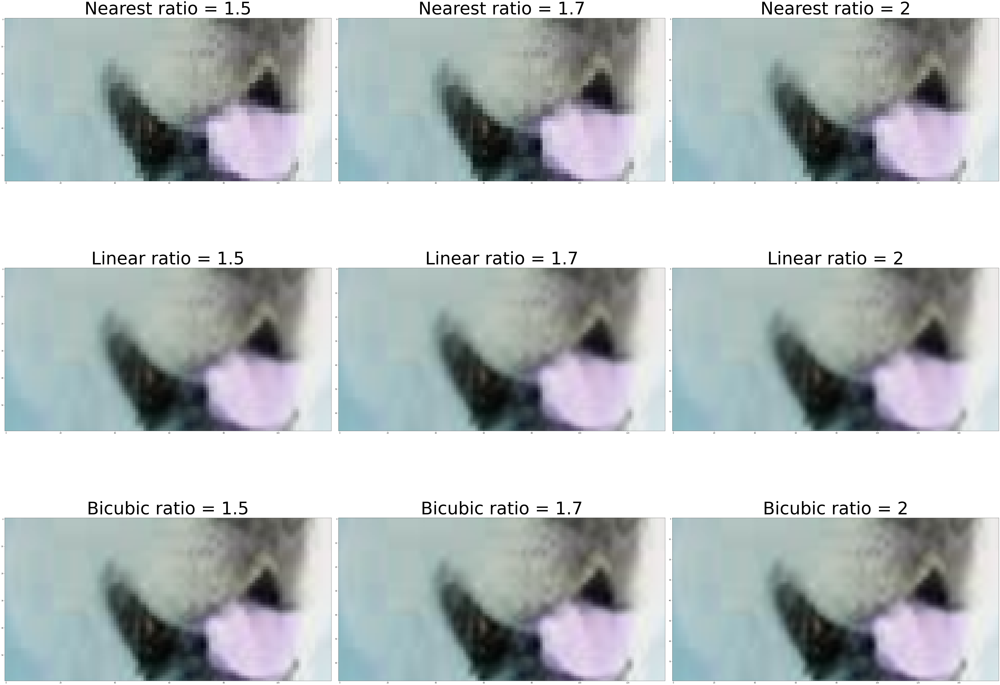

In [32]:
cropNd5 = Nearestdog5[180:240, 390:510]
cropNd7 = Nearestdog7[204:272, 442:578]
cropNd2 = Nearestdog2[240:320, 520:680]
cropLd5 = Lineardog5[180:240, 390:510]
cropLd7 = Lineardog7[204:272, 442:578]
cropLd2 = Lineardog2[240:320, 520:680]
cropBd5 = Bicubicdog5[180:240, 390:510]
cropBd7 = Bicubicdog7[204:272, 442:578]
cropBd2 = Bicubicdog2[240:320, 520:680]
fig, axs = plt.subplots(3, 3, figsize=(80, 60))
fig.tight_layout()
axs[0, 0].imshow(cropNd5)
axs[0, 0].set_title('Nearest ratio = 1.5', fontsize=100)
axs[0, 1].imshow(cropNd7)
axs[0, 1].set_title('Nearest ratio = 1.7', fontsize=100)
axs[0, 2].imshow(cropNd2)
axs[0, 2].set_title('Nearest ratio = 2', fontsize=100)

axs[1, 0].imshow(cropLd5)
axs[1, 0].set_title('Linear ratio = 1.5', fontsize=100)
axs[1, 1].imshow(cropLd7)
axs[1, 1].set_title('Linear ratio = 1.7', fontsize=100)
axs[1, 2].imshow(cropLd2)
axs[1, 2].set_title('Linear ratio = 2', fontsize=100)

axs[2, 0].imshow(cropBd5)
axs[2, 0].set_title('Bicubic ratio = 1.5', fontsize=100)
axs[2, 1].imshow(cropBd7)
axs[2, 1].set_title('Bicubic ratio = 1.7', fontsize=100)
axs[2, 2].imshow(cropBd2)
axs[2, 2].set_title('Bicubic ratio = 2', fontsize=100)

Text(0.5, 1.0, 'Bicubic ratio = 2')

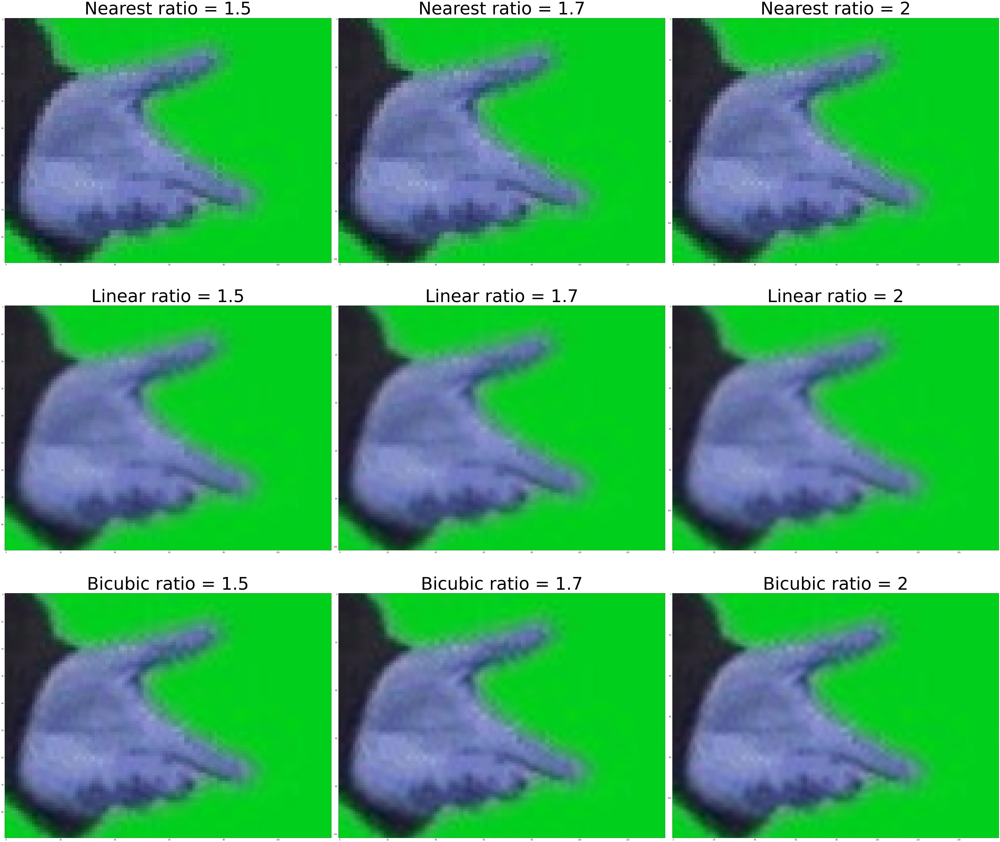

In [34]:
cropNt3 = Nearesttravolta5[345:435, 540:660]
cropNt5 = Nearesttravolta7[391:493, 612:748]
cropNt7 = Nearesttravolta2[460:580, 720:880]
cropLt3 = Lineartravolta5[345:435, 540:660]
cropLt5 = Lineartravolta7[391:493, 612:748]
cropLt7 = Lineartravolta2[460:580, 720:880]
cropBt3 = Bicubictravolta5[345:435, 540:660]
cropBt5 = Bicubictravolta7[391:493, 612:748]
cropBt7 = Bicubictravolta2[460:580, 720:880]
fig, axs = plt.subplots(3, 3, figsize=(80, 69))
fig.tight_layout()
axs[0, 0].imshow(cropNt3)
axs[0, 0].set_title('Nearest ratio = 1.5', fontsize=100)
axs[0, 1].imshow(cropNt5)
axs[0, 1].set_title('Nearest ratio = 1.7', fontsize=100)
axs[0, 2].imshow(cropNt7)
axs[0, 2].set_title('Nearest ratio = 2', fontsize=100)
axs[1, 0].imshow(cropLt3)
axs[1, 0].set_title('Linear ratio = 1.5', fontsize=100)
axs[1, 1].imshow(cropLt5)
axs[1, 1].set_title('Linear ratio = 1.7', fontsize=100)
axs[1, 2].imshow(cropLt7)
axs[1, 2].set_title('Linear ratio = 2', fontsize=100)
axs[2, 0].imshow(cropBt3)
axs[2, 0].set_title('Bicubic ratio = 1.5', fontsize=100)
axs[2, 1].imshow(cropBt5)
axs[2, 1].set_title('Bicubic ratio = 1.7', fontsize=100)
axs[2, 2].imshow(cropBt7)
axs[2, 2].set_title('Bicubic ratio = 2', fontsize=100)

Text(0.5, 1.0, 'Bicubic ratio = 2')

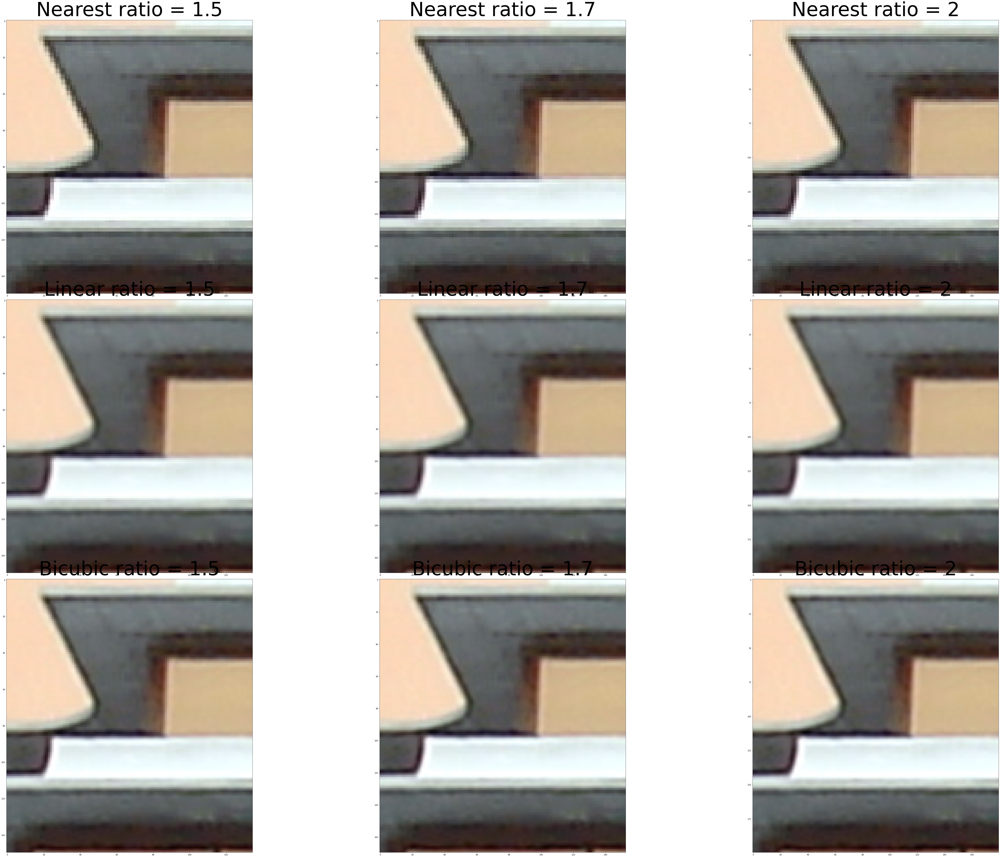

In [35]:
cropNg3 = Nearestgeisel5[1020:1170, 1635:1770]
cropNg5 = Nearestgeisel7[1156:1326, 1853:2006]
cropNg7 = Nearestgeisel2[1360:1560, 2180:2360]
cropLg3 = Lineargeisel5[1020:1170, 1635:1770]
cropLg5 = Lineargeisel7[1156:1326, 1853:2006]
cropLg7 = Lineargeisel2[1360:1560, 2180:2360]
cropBg3 = Bicubicgeisel5[1020:1170, 1635:1770]
cropBg5 = Bicubicgeisel7[1156:1326, 1853:2006]
cropBg7 = Bicubicgeisel2[1360:1560, 2180:2360]
fig, axs = plt.subplots(3, 3, figsize=(80, 60))
fig.tight_layout()
axs[0, 0].imshow(cropNg3)
axs[0, 0].set_title('Nearest ratio = 1.5', fontsize=100)
axs[0, 1].imshow(cropNg5)
axs[0, 1].set_title('Nearest ratio = 1.7', fontsize=100)
axs[0, 2].imshow(cropNg7)
axs[0, 2].set_title('Nearest ratio = 2', fontsize=100)
axs[1, 0].imshow(cropLg3)
axs[1, 0].set_title('Linear ratio = 1.5', fontsize=100)
axs[1, 1].imshow(cropLg5)
axs[1, 1].set_title('Linear ratio = 1.7', fontsize=100)
axs[1, 2].imshow(cropLg7)
axs[1, 2].set_title('Linear ratio = 2', fontsize=100)
axs[2, 0].imshow(cropBg3)
axs[2, 0].set_title('Bicubic ratio = 1.5', fontsize=100)
axs[2, 1].imshow(cropBg5)
axs[2, 1].set_title('Bicubic ratio = 1.7', fontsize=100)
axs[2, 2].imshow(cropBg7)
axs[2, 2].set_title('Bicubic ratio = 2', fontsize=100)

In [41]:
Nearestdog1 = cv2.resize(dog, (int(dog.shape[1]*0.1), int(dog.shape[0]*0.1)), interpolation = cv2.INTER_NEAREST)
Nearestdog2 = cv2.resize(Nearestdog1, (int(Nearestdog1.shape[1]*10), int(Nearestdog1.shape[0]*10)), interpolation = cv2.INTER_NEAREST)
Nearesttravolta1 = cv2.resize(travolta, (int(travolta.shape[1]*0.1), int(travolta.shape[0]*0.1)), interpolation = cv2.INTER_NEAREST)
Nearesttravolta2 = cv2.resize(Nearesttravolta1, (int(Nearesttravolta1.shape[1]*10), int(Nearesttravolta1.shape[0]*10)), interpolation = cv2.INTER_NEAREST)
Nearestgeisel1 = cv2.resize(geisel, (int(geisel.shape[1]*0.1), int(geisel.shape[0]*0.1)), interpolation = cv2.INTER_NEAREST)
Nearestgeisel2 = cv2.resize(Nearestgeisel1, (int(Nearestgeisel1.shape[1]*10), int(Nearestgeisel1.shape[0]*10)), interpolation = cv2.INTER_NEAREST)
Lineardog1 = cv2.resize(dog, (int(dog.shape[1]*0.1), int(dog.shape[0]*0.1)), interpolation = cv2.INTER_LINEAR)
Lineardog2 = cv2.resize(Lineardog1, (int(Lineardog1.shape[1]*10), int(Lineardog1.shape[0]*10)), interpolation = cv2.INTER_LINEAR)
Lineartravolta1 = cv2.resize(travolta, (int(travolta.shape[1]*0.1), int(travolta.shape[0]*0.1)), interpolation = cv2.INTER_LINEAR)
Lineartravolta2 = cv2.resize(Lineartravolta1, (int(Lineartravolta1.shape[1]*10), int(Lineartravolta1.shape[0]*10)), interpolation = cv2.INTER_LINEAR)
Lineargeisel1 = cv2.resize(geisel, (int(geisel.shape[1]*0.1), int(geisel.shape[0]*0.1)), interpolation = cv2.INTER_LINEAR)
Lineargeisel2 = cv2.resize(Lineargeisel1, (int(Lineargeisel1.shape[1]*10), int(Lineargeisel1.shape[0]*10)), interpolation = cv2.INTER_LINEAR)
Bicubicdog1 = cv2.resize(dog, (int(dog.shape[1]*0.1), int(dog.shape[0]*0.1)), interpolation = cv2.INTER_CUBIC)
Bicubicdog2 = cv2.resize(Bicubicdog1, (int(Bicubicdog1.shape[1]*1.5), int(Bicubicdog1.shape[0]*1.5)), interpolation = cv2.INTER_CUBIC)
Bicubictravolta1 = cv2.resize(travolta, (int(travolta.shape[1]*0.1), int(travolta.shape[0]*0.1)), interpolation = cv2.INTER_CUBIC)
Bicubictravolta2 = cv2.resize(Bicubictravolta1, (int(Bicubictravolta1.shape[1]*1.5), int(Bicubictravolta1.shape[0]*1.5)), interpolation = cv2.INTER_CUBIC)
Bicubicgeisel1 = cv2.resize(geisel, (int(geisel.shape[1]*0.1), int(geisel.shape[0]*0.1)), interpolation = cv2.INTER_CUBIC)
Bicubicgeisel2 = cv2.resize(Bicubicgeisel1, (int(Bicubicgeisel1.shape[1]*10), int(Bicubicgeisel1.shape[0]*10)), interpolation = cv2.INTER_CUBIC)


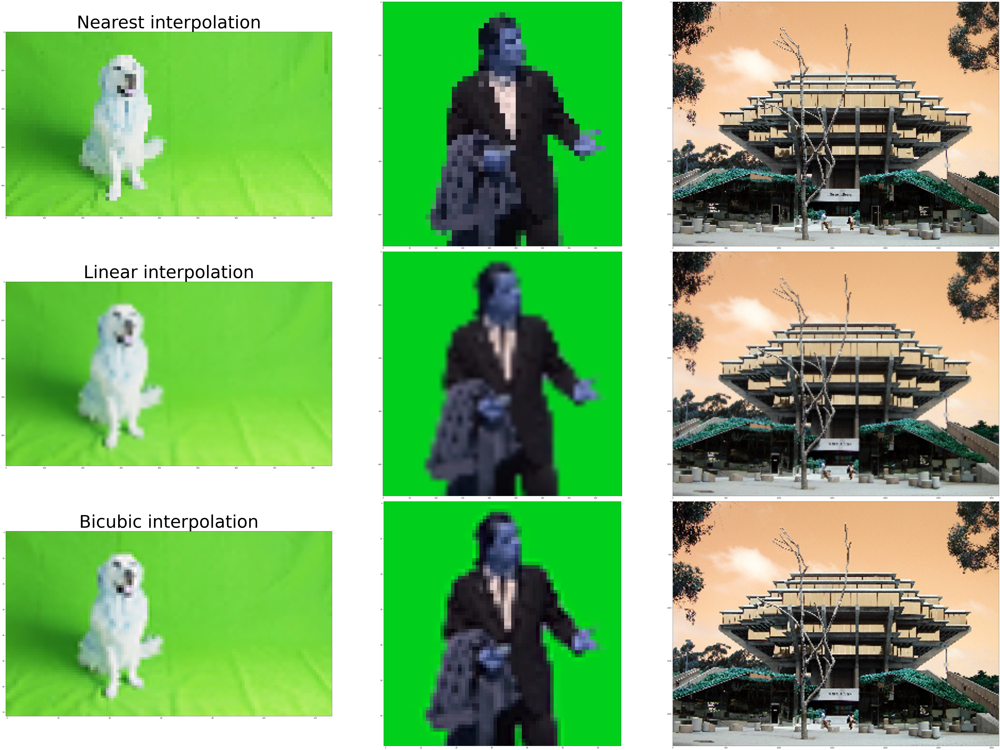

In [42]:
fig, axs = plt.subplots(3, 3, figsize=(80, 60))
fig.tight_layout()
axs[0, 0].imshow(Nearestdog2)
axs[0, 0].set_title('Nearest interpolation', fontsize=100)
axs[0, 1].imshow(Nearesttravolta2)
axs[0, 2].imshow(Nearestgeisel2)
axs[1, 0].imshow(Lineardog2)
axs[1, 0].set_title('Linear interpolation', fontsize=100)
axs[1, 1].imshow(Lineartravolta2)
axs[1, 2].imshow(Lineargeisel2)
axs[2, 0].imshow(Bicubicdog2)
axs[2, 0].set_title('Bicubic interpolation', fontsize=100)
axs[2, 1].imshow(Bicubictravolta2)
axs[2, 2].imshow(Bicubicgeisel2)